In [71]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from scipy import stats
import sklearn

In [2]:
sns.__version__

'0.11.0'

In [3]:
plt.rcParams['figure.figsize'] = (12, 8)
sns.set_theme(style="whitegrid")

<h1 style="text-align: center">Ames House Price Prediction: EDA</h1>
<center><img style="height: 450px" src="https://livability.com/sites/default/files/151SUBAME031.jpg"></center>

<p style="text-align: center">
In this notebook, we will be exploring factores that impacted house sale price in Ames, Iowa. <br/>
The goal of this part is to make sense of provided dataset and turn these insights into actions during the second modeling part. 
</p>

In [4]:
trainDf = pd.read_csv("data/train.csv")
testDf = pd.read_csv("data/test.csv")

fullDf = pd.concat([trainDf, testDf], sort=True).reset_index(drop=True)

## Given Information
It's easy to get lost reviewing the list of available information. I find myself willing to group them somehow meaningfully.

* House Properties
    * Construction Date [YearBuilt]
    * Remodeling Date [YearRemodAdd]
    * Dwelling Class [BldgType] and Subclass [MSSubClass]
    * House Style [HouseStyle]
    * Area (sq. feet) [LotArea]
    * Shape [LotShape]
    * Flatness [LandContour] and slope [LandSlope]
    * Utilities (Gas, water, septic) [Utilities]
    * Overall Material and Finish Quality Rate [OverallQual]
    * Overall Condition Rate [OverallCond]
    * ? [LotConfig]
* House Access
    * Road Access [Street] [LotFrontage]
    * Alley Access [Alley]
    * House Road Connection [LotFrontage]
* House Location
    * Neighborhood (Physical Location) [Neighborhood]
    * Zoning classification [MSZoning]
    * Location Conditions (1 or 2) [Condition1][Condition2]
* Roof Properties
    * Roof Style [RoofStyle]
    * Roof Material [RoofMatl]
* Exterior
    * Exterior Covering (1 or 2 materials) [Exterior1st] [Exterior2nd]
    * Exterior Material Quality [ExterQual]
    * Exterior Material Condition [ExterCond]
* Masonry veneer
    * Masonry Veneer Type [MasVnrType]
    * Masonry Veneer Area [MasVnrArea]
* Basement
    * Foundation Type (stone, wood, etc) [Foundation]
    * Basement Quality [BsmtQual]
    * Basement Condition [BsmtCond]
    * Basement Exposure [BsmtExposure]
    * Basement finished area rating (1 or 2) [BsmtFinType1][BsmtFinType2]
    * Basement Finished area (1 or 2) [BsmtFinSF1] [BsmtFinSF2]
    * Basement Unfinished Area [BsmtUnfSF]
    * Total Basement Area [TotalBsmtSF]
* Heating
    * Heating Type [Heating]
    * Heating Quality and Condition Rate [HeatingQC]
* Air Condition
    * Is Central Air Condition? [CentralAir]
* Electrical System Type [Electrical]
* Floors
    *  First Floor Area [1stFlrSF]
    * Second Floor Area [2ndFlrSF]
* ? [LowQualFinSF]
* Above Ground Living Area [GrLivArea]
* Bathroom
    * Basement Full Bathroom [BsmtFullBath]
    * Basement Half Bathroom [BsmtHalfBath]
    * Full bathroom above grade [FullBath]
    * Half bathroom above grade [HalfBath]
* Bedroom
    * Bedroom above grade (w/o basement bedrooms) [BedroomAbvGr]
* Kitchen
    * Kitchen Above Grade [KitchenAbvGr]
    * Kitchen Quality [KitchenQual]
* Total Rooms above grade (w/o bathrooms) [TotRmsAbvGrd]
* Home Functionality [Functional]
* Fireplaces
    * Number of fireplaces [Fireplaces]
    * Fireplace Quality [FireplaceQu]
* Garage
    * Garage Type [GarageType]
    * Year Garage was built [GarageYrBlt]
    * Interior Finish of the garage [GarageFinish]
    * Garage Size (in cars) [GarageCars]
    * Garage Area [GarageArea]
    * Garage Quality [GarageQual]
    * Garage Condition [GarageCond]
* Paved driveway (paved, dirt, etc) [PavedDrive]
* Porch
    * Wood Deck Area [WoodDeckSF]
    * Open Porch Area (in sq ft) [OpenPorchSF]
    * Enclosed Porch Area [EnclosedPorch]
    * 3 seasons porch area [3SsnPorch]
    * Screen Porch area [ScreenPorch]
* Pool
    * Pool area [PoolArea]
    * Pool Quality [PoolQC]
* Miscellaneous Features (elevator, 2nd garage, etc) [MiscFeature]
    * Miscellaneous Features Value in $ [MiscVal]
* Fence [Fence]
* Sale Information
    * Month Sold [MM]
    * Year Sold [YYYY]
    * Sale Type (Warranty Deed, new, etc) [SaleType]
    * Sale Condition (family sale, normal sale, etc) [SaleCondition]

## 1. Explanatory Data Analys

Given training dataset has:
* a vast number of features (`80`)
* a small number of training examples (`2918`)

In [5]:
fullDf.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2919 entries, 0 to 2918
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   1stFlrSF       2919 non-null   int64  
 1   2ndFlrSF       2919 non-null   int64  
 2   3SsnPorch      2919 non-null   int64  
 3   Alley          198 non-null    object 
 4   BedroomAbvGr   2919 non-null   int64  
 5   BldgType       2919 non-null   object 
 6   BsmtCond       2837 non-null   object 
 7   BsmtExposure   2837 non-null   object 
 8   BsmtFinSF1     2918 non-null   float64
 9   BsmtFinSF2     2918 non-null   float64
 10  BsmtFinType1   2840 non-null   object 
 11  BsmtFinType2   2839 non-null   object 
 12  BsmtFullBath   2917 non-null   float64
 13  BsmtHalfBath   2917 non-null   float64
 14  BsmtQual       2838 non-null   object 
 15  BsmtUnfSF      2918 non-null   float64
 16  CentralAir     2919 non-null   object 
 17  Condition1     2919 non-null   object 
 18  Conditio

### 1.1 Missing information

Let's check missing information in our dataset.

In [6]:
missingDf = fullDf.isnull().sum()
missingDf = missingDf.drop(missingDf[missingDf == 0].index).sort_values(ascending=False)
missingDf.drop(['SalePrice'], inplace=True)

missingDf = pd.DataFrame({"missing_count": missingDf})
missingDf["missing_rate"] = (missingDf["missing_count"] / len(fullDf)) * 100

Text(0.5, 1.0, 'Missing Data per Feature')

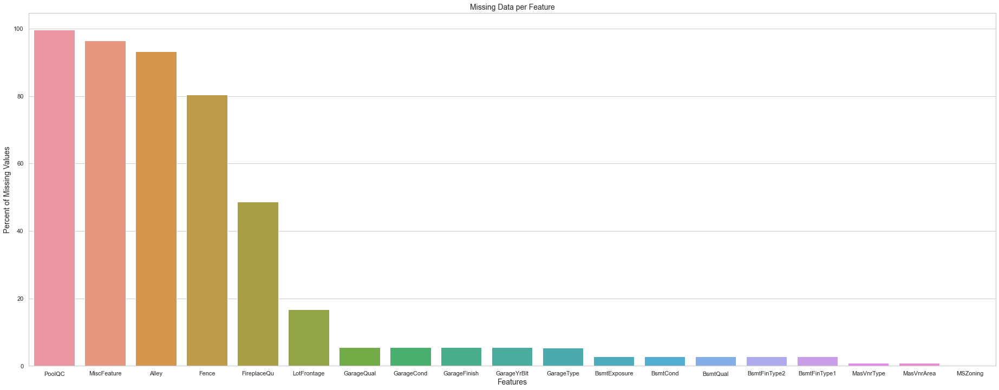

In [7]:
fiveMissingDf = missingDf[missingDf["missing_count"] > 3]

plt.figure(figsize=(32, 12))
sns.barplot(x=fiveMissingDf.index, y="missing_rate", data=fiveMissingDf)
plt.xlabel('Features', fontsize=14)
plt.ylabel('Percent of Missing Values', fontsize=14)
plt.title('Missing Data per Feature', fontsize=14)

In [8]:
missingDf

,missing_count,missing_rate
PoolQC,2909,99.657417
MiscFeature,2814,96.402878
Alley,2721,93.216855
Fence,2348,80.438506
FireplaceQu,1420,48.646797
LotFrontage,486,16.649538
GarageQual,159,5.447071
GarageCond,159,5.447071
GarageFinish,159,5.447071
GarageYrBlt,159,5.447071


There are 34 features that are affected by missing values. Let's review this list:
* `FireplaceQu`, `GarageX`, `Alley`, `PoolQC` - all Neighborhoods have alleys systems, fireplaces, garages or pools
* `MiscFeature` is an optional feature that indicates additional benefits of the lot. It impacts the house sale price by `MiscVal` amount.

We may impute reviewed missing features by some constant value that indicates that feature is not part of a lot.

Some of the features do seem to be missing like `SaleType`, `MSZoning`, `Functional`, etc. However, we may not use them, so let's focus on the rest of rest of available information and decide about them later on.

Also, the training dataset have all SalePrice information specified:

In [9]:
trainDf['SalePrice'].isnull().sum()

0

## 1.2 HouseProperties - SalePrice Relations

### 1.2.1 Sale Price Distribution

First things goes first. Let's see SalePrice distribution shape:

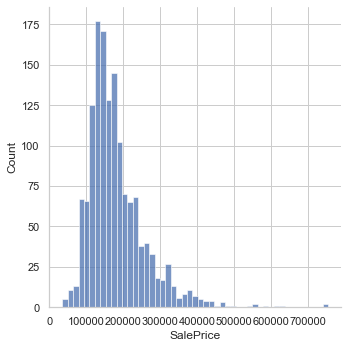

In [90]:
sns.displot(fullDf["SalePrice"])

In [11]:
print("Skewness: %f" % trainDf['SalePrice'].skew())
print("Kurtosis: %f" % trainDf['SalePrice'].kurt())

Skewness: 1.882876
Kurtosis: 6.536282


SalePrice distribution resembles a normal distribution that skewed to the right.

We may want to `apply log scaling` to normalize the SalePrice shape, because ML algorithms performs better on the normally distributed features.

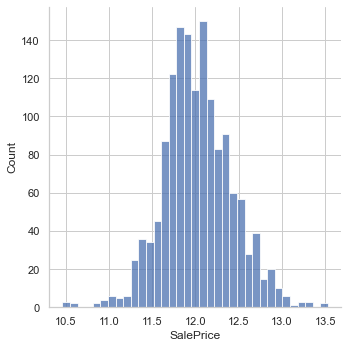

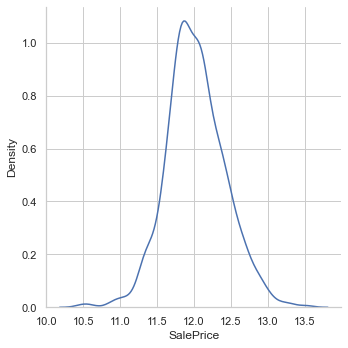

In [105]:
sns.displot(np.log(fullDf['SalePrice']))
sns.displot(np.log(fullDf['SalePrice']), kind='kde')

What about SalePrice central tendency?

In [12]:
fullDf['SalePrice'].describe()

count      1460.000000
mean     180921.195890
std       79442.502883
min       34900.000000
25%      129975.000000
50%      163000.000000
75%      214000.000000
max      755000.000000
Name: SalePrice, dtype: float64

The `75%` of houses have price `$214k` and less. 25%, 50% and 75% may define a price tiers for us to simplify understand of the catgorical data. With this in mind, let's add a new column `SalePriceGroup` with three tiers:
* Cheap Groups:
    * `Less than 25%` houses (<= $129k)
    * Houses from `25% - 50%` range (>\$129k and <=\$163k)
* Expensive Groups:
    * Houses from `50%-75%` range (>\$163k and <=\$214k)
    * `75% and more` 

In [13]:
def imputeSalePriceGroup(salePrice):
    if salePrice <= 129975:
        return "25% and less"
    if salePrice > 129975 and salePrice <= 163000:
        return "25% - 50%"
    if salePrice > 163000 and salePrice < 214000:
        return "50% - 75%"
    if salePrice >= 214000:
        return "75% and more"

fullDf['SalePriceGroup'] = fullDf['SalePrice'].apply(imputeSalePriceGroup)

It's useful to see a correlations between numerical features before we take a deeper look at each feature:

<AxesSubplot:>

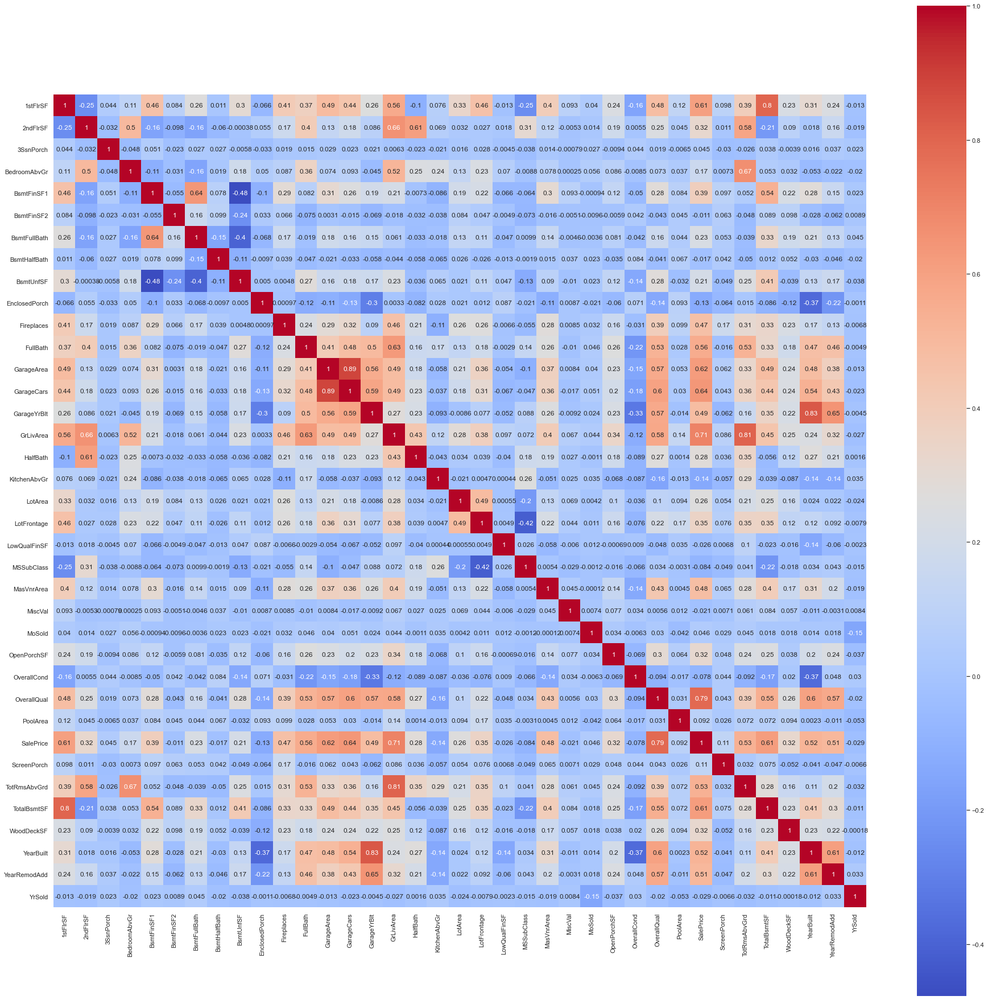

In [14]:
plt.figure(figsize=(32, 32))
sns.heatmap(fullDf.drop(['Id'], axis=1).corr(), annot=True, square=True, cmap='coolwarm')

#### 1.3.2 Room Number, Lot and Living Areas, Floor Areas

`Living Area` is suppose to impact `SalePrice`:

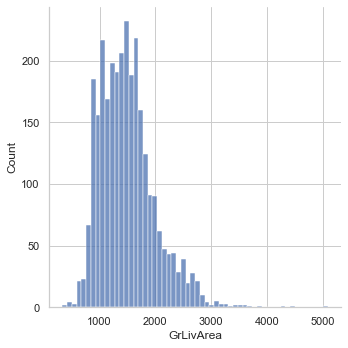

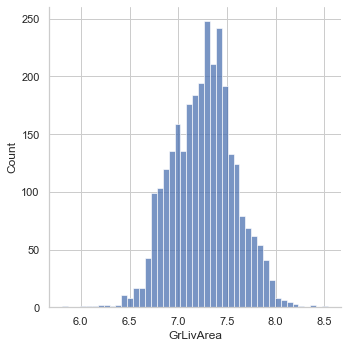

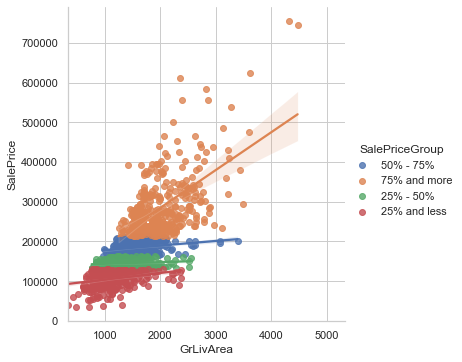

In [97]:
sns.displot(data=fullDf['GrLivArea'])
sns.displot(data=np.log(fullDf['GrLivArea']))
sns.lmplot(data=fullDf, x="GrLivArea", y="SalePrice", hue="SalePriceGroup")

We see a linear correlation and raising the SalePrice as the living area goes up/right.

There are two outliers. Their area more than 4,000 $ft^2$ but the sale prices are below than an average. Let's remove them from the dataset:

In [16]:
fullDf.drop(
    fullDf[(fullDf['GrLivArea'] > 4000) & (fullDf['SalePrice'] < 700000)].index,
    inplace=True
)

Next feature is Total Room Number. 

Total Room Number is connected to Living Area (correlation - `0.81`). The more living area, the more rooms normally present.

Room number seems to correlate with SalePrice as well (correlation - `0.54`). Namely, >75% tier have a good correlation with room number. We don't see the same for the rest of tiers.

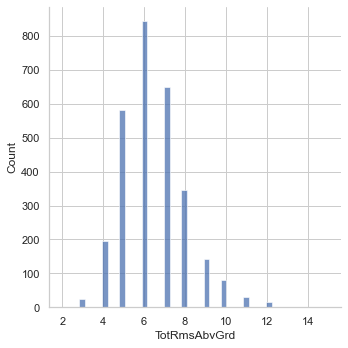

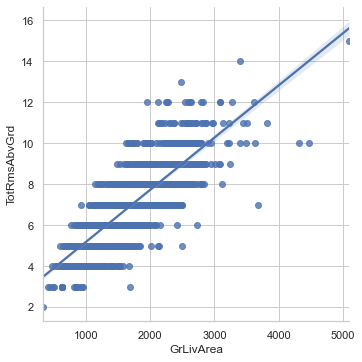

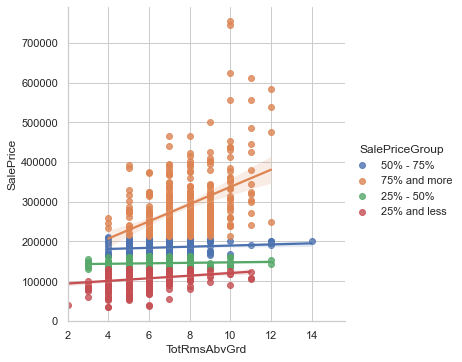

In [17]:
sns.displot(data=fullDf['TotRmsAbvGrd'])
sns.lmplot(data=fullDf, x='GrLivArea', y='TotRmsAbvGrd')
sns.lmplot(data=fullDf, x='TotRmsAbvGrd', y='SalePrice', hue='SalePriceGroup')

Most of the lot areas are less than 50000 $ft^2$. Probably, there might be some building standards that keep lot areas inside of the range.

That's why Lot Area just slightly correlates with SalPrice (correlation - `0.21`).

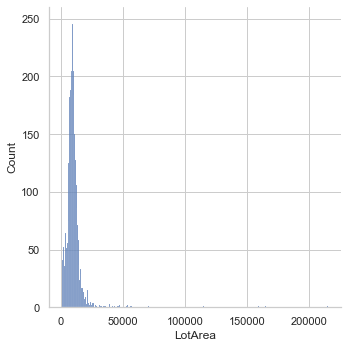

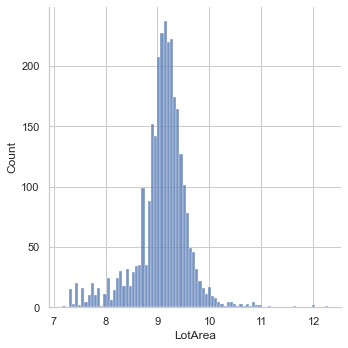

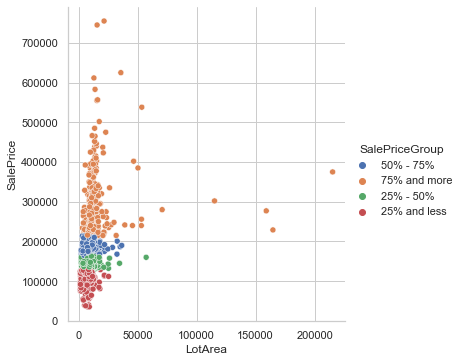

In [106]:
sns.displot(data=fullDf['LotArea'])
sns.displot(data=np.log(fullDf['LotArea']))
sns.relplot(data=fullDf, x='LotArea', y='SalePrice', hue='SalePriceGroup')

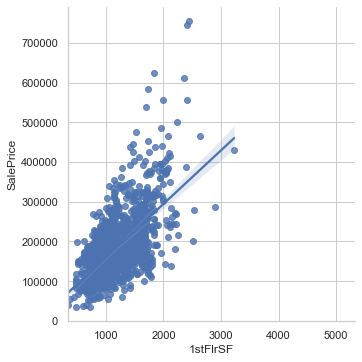

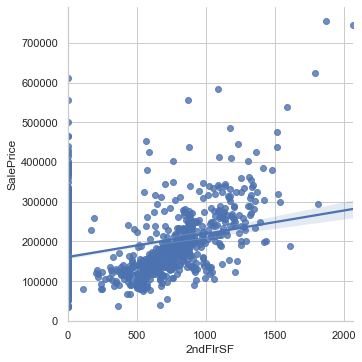

In [19]:
sns.lmplot(data=fullDf, x='1stFlrSF', y='SalePrice')
sns.lmplot(data=fullDf, x="2ndFlrSF", y="SalePrice")

Floor areas correlates with SalePrice. Namely, SalePrice seems to be linearly dependent on 1st floor area.

If we summ 1st and 2nd floar areas, we will get the `living area` feature.

#### 1.3.4 House Types and Styles

Dataset contains three features related to house building style.

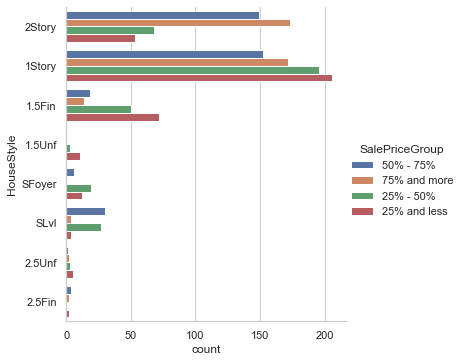

In [20]:
# House Styles correlate with sale prices
# House prices > 75% perc: 2Story, 1Story 1.5Fin
# House prices > 50% and > 75% perc: 2Story, 1Story, SLvl, 2.5Fin
# House prices < 25% and > 50% perc: 1Story, 2Story, 1.5Fin, SLvl, 2.5Unf, 1.5Unf
# House prices < 25% perc: 1.5Fin, 1.5Unf, 2.5Unf

sns.catplot(data=fullDf, y='HouseStyle', hue='SalePriceGroup', kind='count')

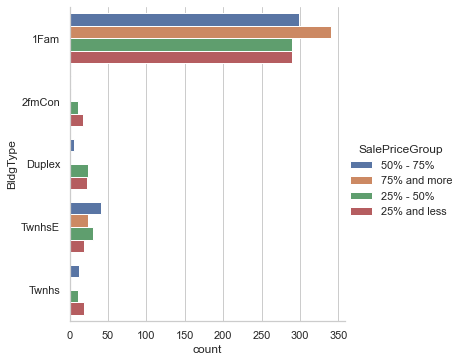

In [21]:
# Dwelling Type correlates house sale price
## House prices > 75% perc: 1Fam, TwnhsE
## House prices > 50% and < 75% perc: 1Fam, TwnhsE, TwnhsI
## House prices > 25% and < 50% perc: 1Fam, 2FamCon, TwnhsE, TwnhsI, Duplex
## House prices < 25% perc: 1Fam, 2fmCon, TwnhsE, TwnhsI, Duplex

sns.catplot(data=fullDf, y='BldgType', hue='SalePriceGroup', kind='count')

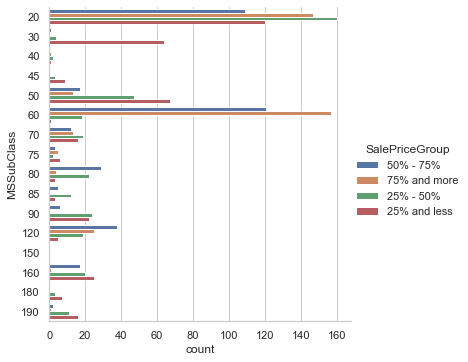

In [22]:
# MSSubClass type of dwelling is a helpful differentiator of the sale price
## House prices > 75% perc: 20, 60, 70, 75, 80, 120 (1 and 2 story of 1946 and newer)
## House prices > 50% and < 75% perc: 20, 60, 80, 120, 160 (diff styles of newer types)
## House prices > 25% and < 50% perc: 20, 30, 40, 45, 50, 60, 70, 80, 85, 90, 120, 160, 190
## House prices < 25% perc: 20, 30, 45, 50, 70, 75, 90, 120, 160, 190 (Older and unfinished styles)

sns.catplot(y="MSSubClass", hue="SalePriceGroup", kind="count", data=fullDf)

In [23]:
from sklearn.preprocessing import OrdinalEncoder, LabelEncoder
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2

unselectedFeatureDf = trainDf[['MSSubClass', 'BldgType', 'HouseStyle']]
unselectedFeatureDf['BldgType'] = LabelEncoder().fit_transform(unselectedFeatureDf['BldgType'])
unselectedFeatureDf['MSSubClass'] = LabelEncoder().fit_transform(unselectedFeatureDf['MSSubClass'])
unselectedFeatureDf['HouseStyle'] = LabelEncoder().fit_transform(unselectedFeatureDf['HouseStyle'])

fs = SelectKBest(score_func=chi2, k='all')
fs.fit_transform(unselectedFeatureDf, trainDf['SalePrice'])

for i in range(len(fs.scores_)):
	print('Feature %d: %f' % (i, fs.scores_[i]))

Feature 0: 2600.032593
Feature 1: 1951.478245
Feature 2: 812.887720


LotShape and LotConfig

<AxesSubplot:xlabel='count', ylabel='LotConfig'>

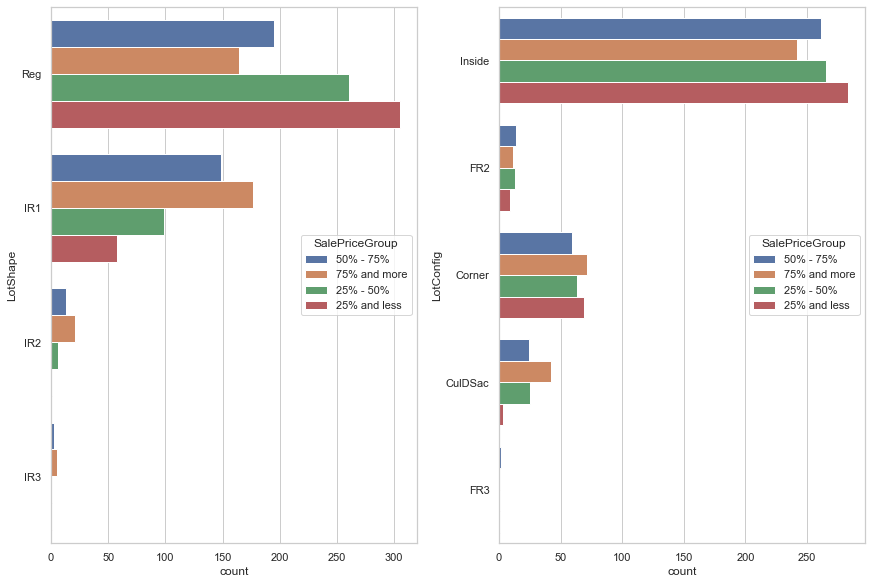

In [24]:
# Houses with SalePrice > 75% percentile dominate among houses with irregular shape.
# Most of the Houses with SalePrice < 25% have a regular shape tho.

# Lot configuration: 
## Houses with SalePrice > 75% percentile have Corner, Inside, FR2, CulDSac types
## Houses with SalePrice < 25% have mostly inside types and also Corner and FR2 types
# More info: https://www.thetruthaboutrealty.com/real-estate-lot-types/

fig, ax = plt.subplots(1, 2, constrained_layout=True)

sns.countplot(data=fullDf, y="LotShape", hue="SalePriceGroup", ax=ax[0])
sns.countplot(data=fullDf, y="LotConfig", hue="SalePriceGroup", ax=ax[1])

In [25]:
unselectedFeatureDf = trainDf[['LotShape', 'LotConfig']]
unselectedFeatureDf['LotShape'] = LabelEncoder().fit_transform(unselectedFeatureDf['LotShape'])
unselectedFeatureDf['LotConfig'] = LabelEncoder().fit_transform(unselectedFeatureDf['LotConfig'])

fs = SelectKBest(score_func=chi2, k='all')
fs.fit_transform(unselectedFeatureDf, trainDf['SalePrice'])

for i in range(len(fs.scores_)):
	print('Feature %d: %f' % (i, fs.scores_[i]))

Feature 0: 802.972897
Feature 1: 564.633630


`Frontage` is width of a lot, measured at the front part of the lot. `Footage` correlates with `LotArea`.

More Info: https://www.gimme-shelter.com/frontage-50043/

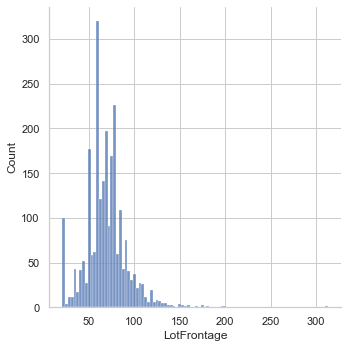

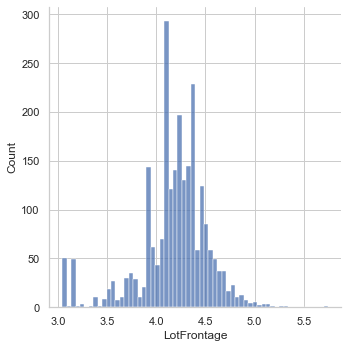

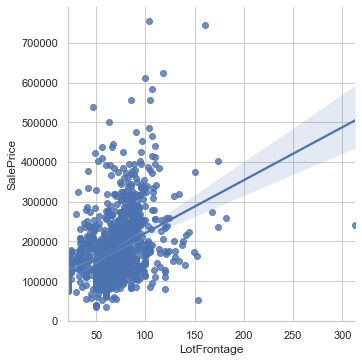

In [108]:
# How to impute missing data if we want to use it?
sns.displot(fullDf['LotFrontage'])
sns.displot(np.log(fullDf['LotFrontage']))
sns.lmplot(data=fullDf, x='LotFrontage', y='SalePrice')

In [27]:
trainDf[trainDf['LotFrontage'].notnull()]['LotFrontage'].describe()

count    1201.000000
mean       70.049958
std        24.284752
min        21.000000
25%        59.000000
50%        69.000000
75%        80.000000
max       313.000000
Name: LotFrontage, dtype: float64

~16% of footage information is missing in the dataset. If we decide to use frontage in the modeling, we will need to came up with imputing stategy.

The simples way is to impute mean frontage based on `Neighborhood` and `MSSubClass`. 
A harder way way would be leverage knowledge that the frontage depends on `LotArea`, `1stFloorArea`, `Neighborhood` and `MSSubClass` and train a linear regression model to impute the information. We should have enough trainging data for this (96% of frontage records are in place).

#### LandContour and LandSlope

<AxesSubplot:xlabel='count', ylabel='LandSlope'>

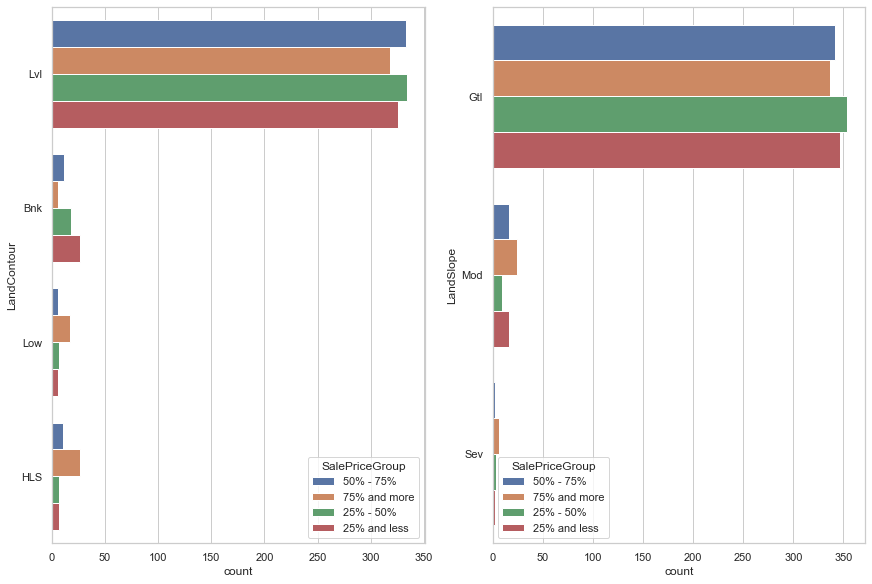

In [28]:
# Land Contour
## Low and hillside flatness as well as moderate and severe slopes dominate among house with SalePrice > 75% percentile. Probably, these houses have some kind of landscape design work done

fig, ax = plt.subplots(1, 2, constrained_layout=True)

sns.countplot(data=fullDf, y="LandContour", hue="SalePriceGroup", ax=ax[0])
sns.countplot(data=fullDf, y="LandSlope", hue="SalePriceGroup", ax=ax[1])

In [29]:
unselectedFeatureDf = trainDf[['LandContour', 'LandSlope']]
unselectedFeatureDf['LandContour'] = LabelEncoder().fit_transform(unselectedFeatureDf['LandContour'])
unselectedFeatureDf['LandSlope'] = LabelEncoder().fit_transform(unselectedFeatureDf['LandSlope'])

fs = SelectKBest(score_func=chi2, k='all')
fs.fit_transform(unselectedFeatureDf, trainDf['SalePrice'])

for i in range(len(fs.scores_)):
	print('Feature %d: %f' % (i, fs.scores_[i]))

Feature 0: 124.357379
Feature 1: 889.793781


#### Foundation and Basement

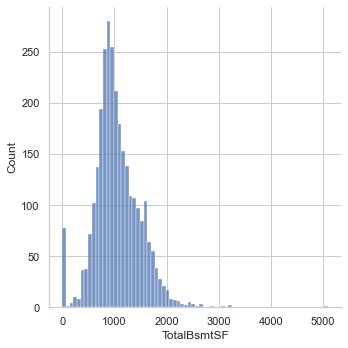

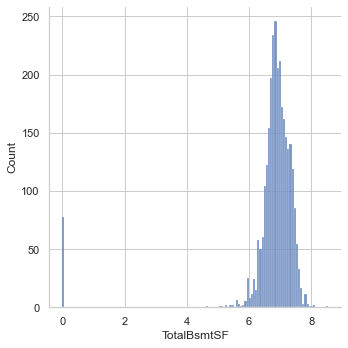

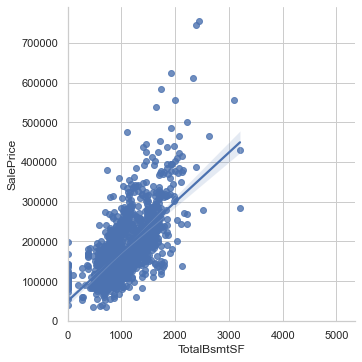

In [110]:
sns.displot(fullDf['TotalBsmtSF'])
sns.displot(np.log1p(fullDf['TotalBsmtSF']))
sns.lmplot(data=fullDf, x='TotalBsmtSF', y='SalePrice')

While basement area is not that attractive as above ground one, it still strongly correlates with SalePrice.

Basement Quality and Condition should help us to calibrate a part of SalePrice that the basement brings:

<AxesSubplot:xlabel='count', ylabel='BsmtCond'>

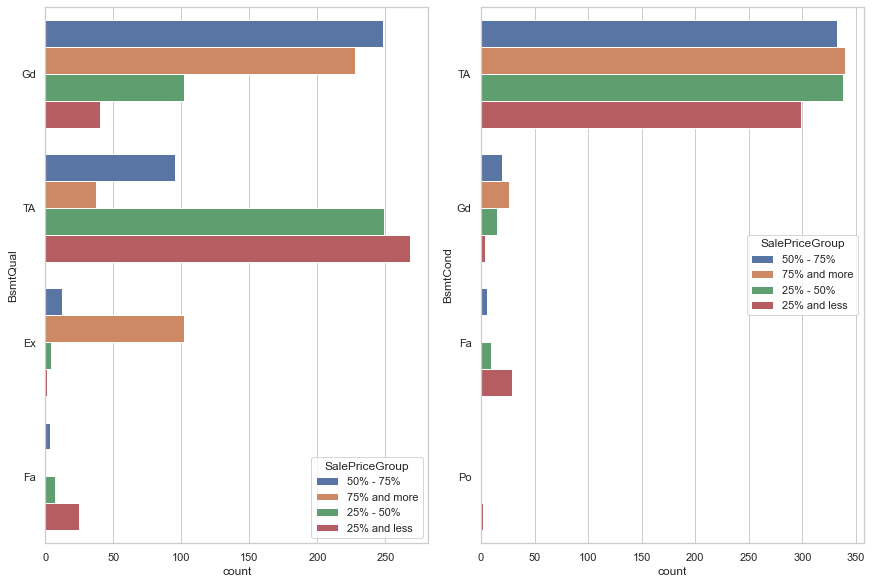

In [31]:
fig, ax = plt.subplots(1, 2, constrained_layout=True)

sns.countplot(data=fullDf, y="BsmtQual", hue="SalePriceGroup", ax=ax[0])
sns.countplot(data=fullDf, y="BsmtCond", hue="SalePriceGroup", ax=ax[1])

Basement Quality and Condition show a typical situation: >50% tier has basements with above average conditions and built from quality materials.


Another metric is whenever basement is finished or not:

<AxesSubplot:xlabel='count', ylabel='BsmtFinType2'>

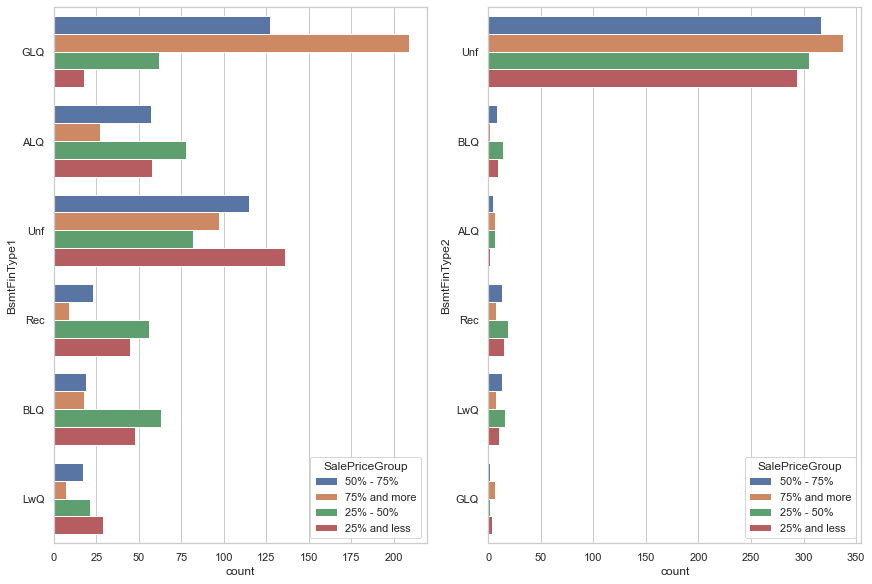

In [32]:
fig, ax = plt.subplots(1, 2, constrained_layout=True)

sns.countplot(data=fullDf, y="BsmtFinType1", hue="SalePriceGroup", ax=ax[0])
sns.countplot(data=fullDf, y="BsmtFinType2", hue="SalePriceGroup", ax=ax[1])

Basement may be finished in different ways. It can be turned into recreation, living quarters or bathrooms:

More Info: https://www.cidbasements.com/qualifies-finished-basement#:~:text=A%20basement%20is%20finished%20when,level%20ceilings%2C%20and%20finished%20walls.

<AxesSubplot:xlabel='count', ylabel='BsmtHalfBath'>

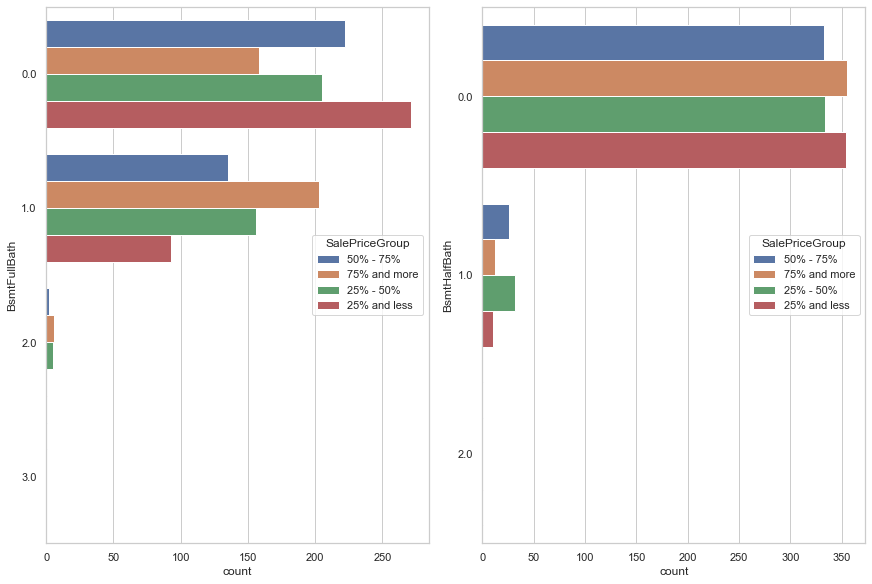

In [33]:
fig, ax = plt.subplots(1, 2, constrained_layout=True)

sns.countplot(data=fullDf, y="BsmtFullBath", hue="SalePriceGroup", ax=ax[0])
sns.countplot(data=fullDf, y="BsmtHalfBath", hue="SalePriceGroup", ax=ax[1])

Big part of houses don't have bathrooms in the basement. Half bathrooms in the basement is rare and some houses actully have full bathrooms in the basement.

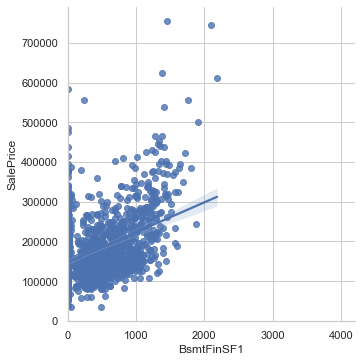

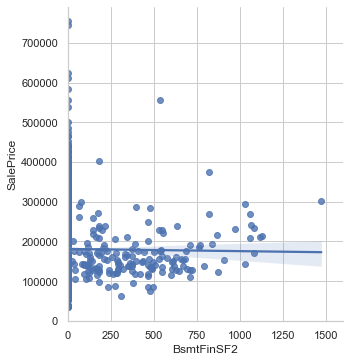

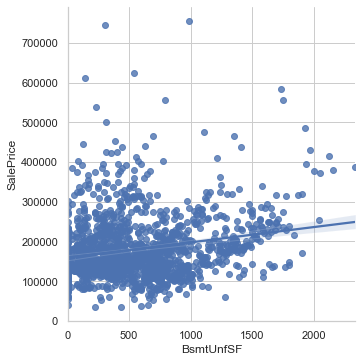

In [34]:
sns.lmplot(data=fullDf, x='BsmtFinSF1', y='SalePrice')
sns.lmplot(data=fullDf, x='BsmtFinSF2', y='SalePrice')
sns.lmplot(data=fullDf, x='BsmtUnfSF', y='SalePrice')

Essentially, **TotalBsmtSF** is a sum of **BsmtFinSF1**, **BsmtFinSF2** and **BsmtUnfSF**. 

All missing information in these fields we can impute with zeroes. Most likely, missing information in basement areas mean that a lot doesn't have basement.

<AxesSubplot:xlabel='count', ylabel='BsmtExposure'>

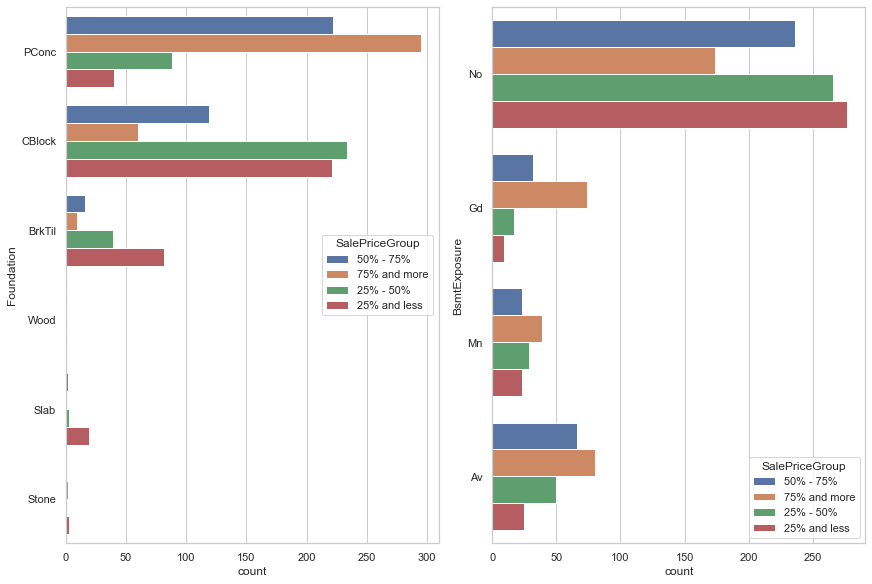

In [35]:
fig, ax = plt.subplots(1, 2, constrained_layout=True)

sns.countplot(data=fullDf, y="Foundation", hue="SalePriceGroup", ax=ax[0])
sns.countplot(data=fullDf, y="BsmtExposure", hue="SalePriceGroup", ax=ax[1])

Poured Contrete foundation is popular in >50% tier. It seems to be a modern way to found houses. The rest of types may be just old fashion.

#### House Overall Condition and Material Quality

<AxesSubplot:xlabel='count', ylabel='OverallQual'>

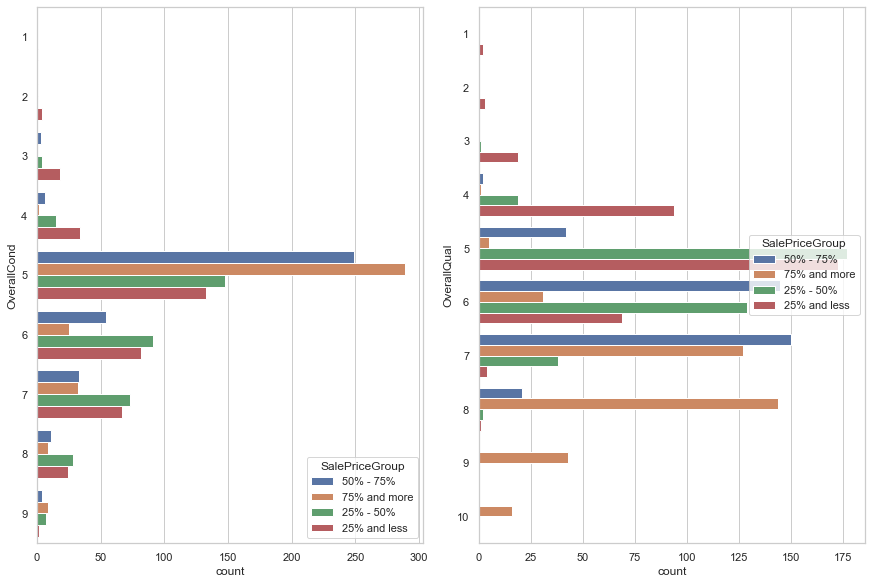

In [36]:
fig, ax = plt.subplots(1, 2, constrained_layout=True)

sns.countplot(data=fullDf, y="OverallCond", hue="SalePriceGroup", ax=ax[0])
sns.countplot(data=fullDf, y="OverallQual", hue="SalePriceGroup", ax=ax[1])

Overall Condition and Material Quality strongly correlates with SalePrices.

Houses with SalePrice > 50% percentile have average and higher overall condition. Lots with SalePrice < 50% tier have a higher percentage among below average condition houses, but generally they are included to all condition groups.

Overall Material Quality seems to differentiate expensive houses from cheap ones. Lots with SalePrice < 50% tier dominates in average and below quality groups. In above average quality groups, there are a bigger percentage of houses with SalePrice > 50% tier (particularly, lots with SalePrice > 75% tier prevail in "very good" and above quality groups).

<AxesSubplot:xlabel='count', ylabel='Functional'>

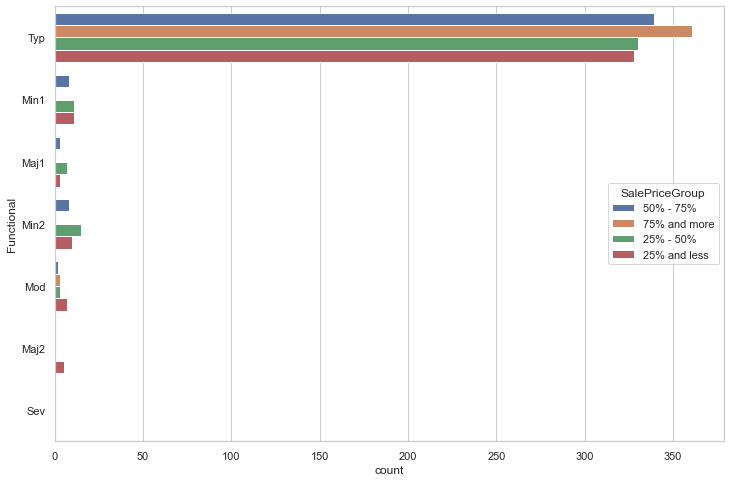

In [37]:
# Home functionality affects house sale price. 
sns.countplot(data=fullDf, y="Functional", hue="SalePriceGroup")

Samples with a functionality other than "Typical" losses sale prices drastically.

#### Year Built and Renovate

<AxesSubplot:xlabel='YearBuilt', ylabel='Count'>

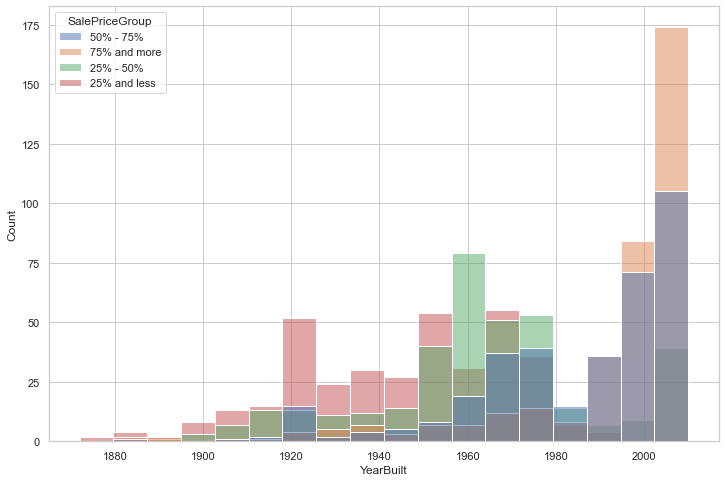

In [38]:
# YearBuilt impacts SalePrice. Most of the cheap houses (<50% percentile) are built in between of 1880 and 1970
# Expensive houses (>50%) have been built recently

sns.histplot(data=fullDf, x="YearBuilt", hue="SalePriceGroup")

In [39]:
fullDf['LotAge'] = fullDf['YrSold'] - fullDf['YearBuilt']

<AxesSubplot:>

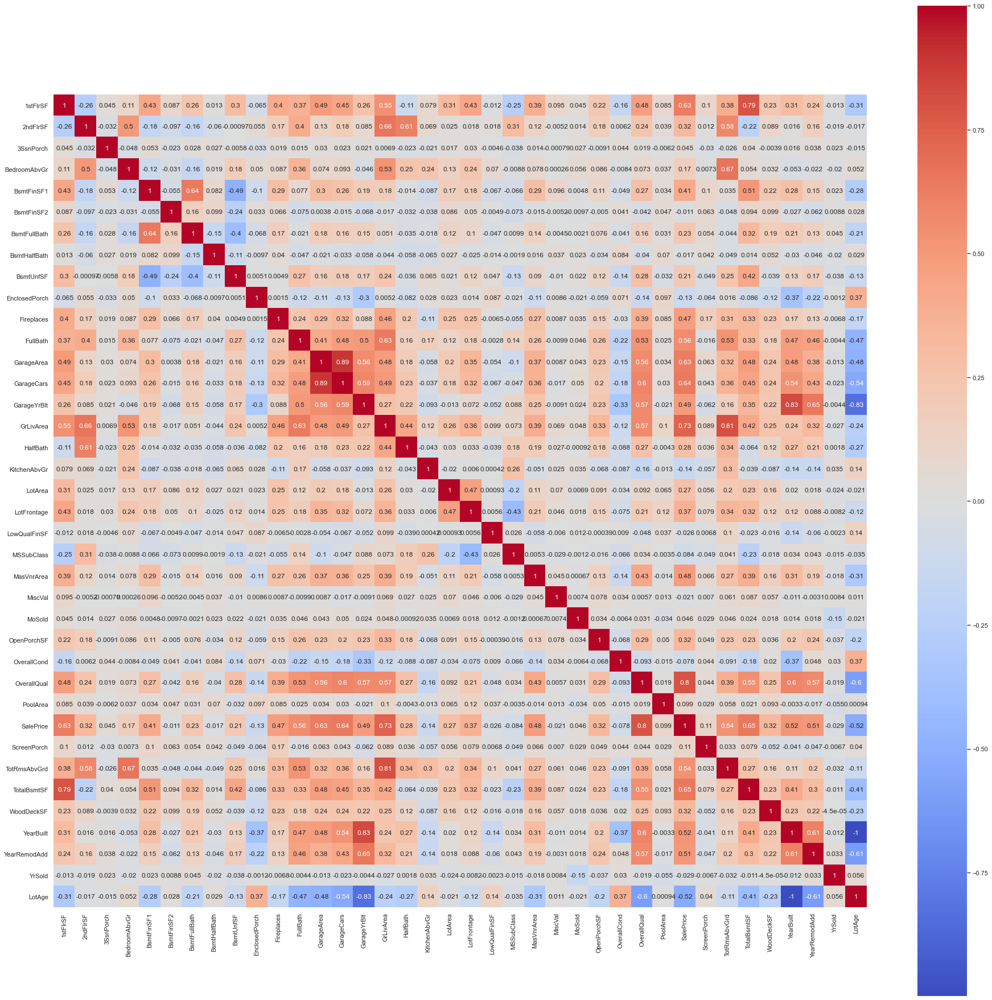

In [40]:
plt.figure(figsize=(32, 32))
sns.heatmap(fullDf.drop(['Id'], axis=1).corr(), annot=True, square=True, cmap='coolwarm')

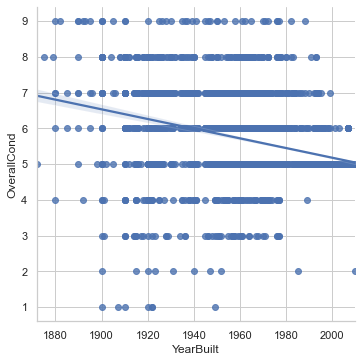

In [41]:
sns.lmplot(data=fullDf, x='YearBuilt', y='OverallCond')

#### House Access

<AxesSubplot:xlabel='count', ylabel='Street'>

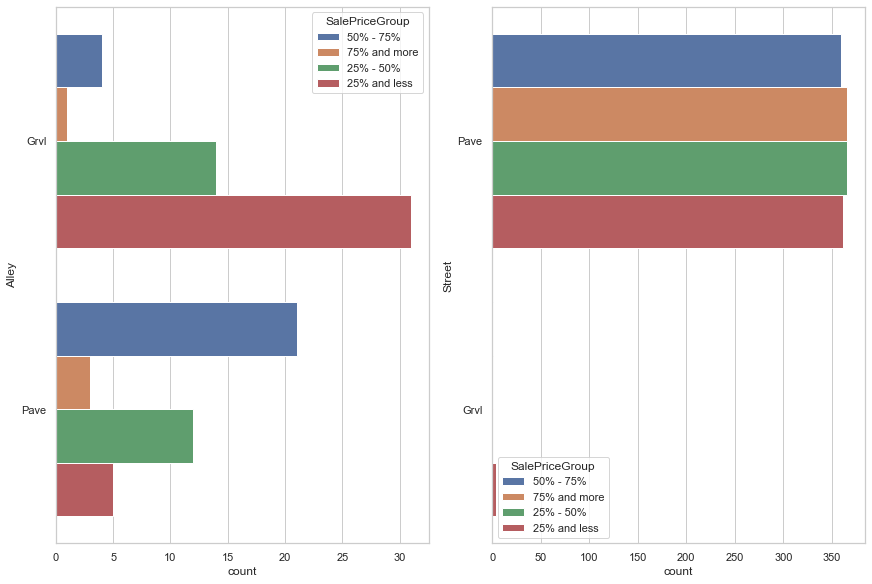

In [42]:
# Most of houses that have SalePrice < 50% connected with gravel alleys or gravel streets.

fig, ax = plt.subplots(1, 2, constrained_layout=True)

sns.countplot(data=fullDf, y="Alley", hue="SalePriceGroup", ax=ax[0])
sns.countplot(data=fullDf, y="Street", hue="SalePriceGroup", ax=ax[1])

<AxesSubplot:xlabel='count', ylabel='PavedDrive'>

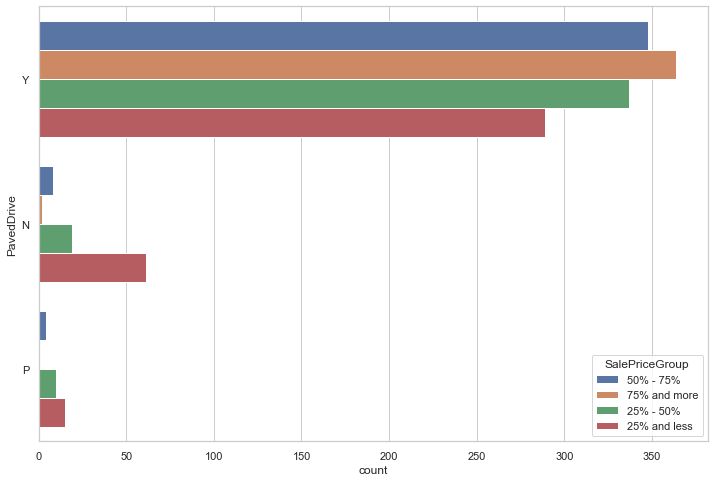

In [43]:
# Conclusions?

sns.countplot(data=fullDf, y="PavedDrive", hue="SalePriceGroup")

House Location: Neighborhood, Zoning and Additional Conditions

<AxesSubplot:xlabel='count', ylabel='MSZoning'>

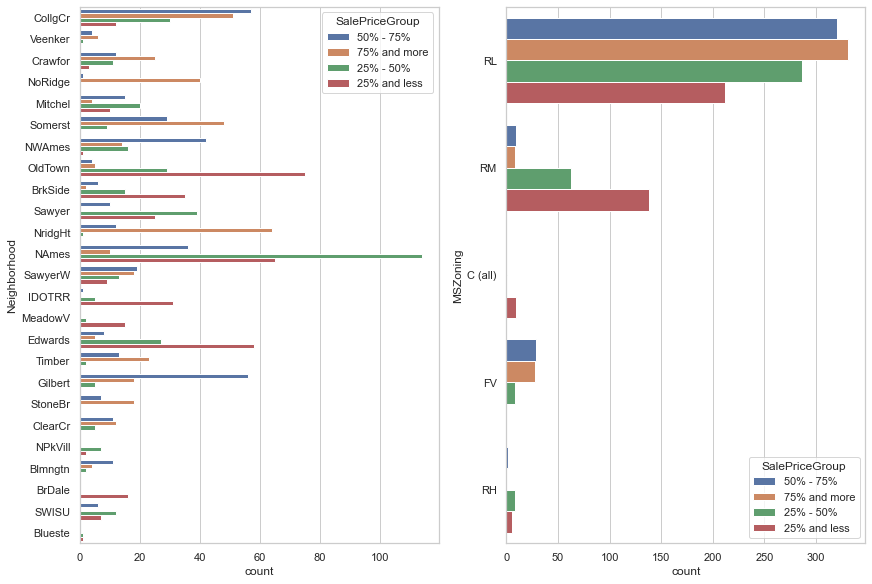

In [44]:
# Neighborhood and MSZoning do differentiate dataset:

# Zoning with house price above the mean: RL, FV
# Zoning with house price below the mean: RM, C, RH

# Neighborhoods with house price below the mean: IDOTRR, Swisu, DrDale, NPkVill, MeadowV, Sawyer, OldTown, Edwards, NAmes
# Neighborhoods with house price above the mean: NoRidge, Mitchel, Crawfor, SawyerW, Timber, Somerst, CollgeCr, Gilbert, NWAmes
# Neighborhoods with house price above 75% perct: NridgHt, CollgeCr, Crawfor, Timber, StoreBr

#https://www.investopedia.com/terms/z/zoning.asp#:~:text=Zoning%20allows%20local%20governments%20to,among%20other%20more%20specific%20designations.

fig, ax = plt.subplots(1, 2, figsize=(12, 8), constrained_layout=True)

sns.countplot(data=fullDf, y="Neighborhood", hue="SalePriceGroup", ax=ax[0])
sns.countplot(data=fullDf, y="MSZoning", hue="SalePriceGroup", ax=ax[1])

<AxesSubplot:xlabel='count', ylabel='Condition2'>

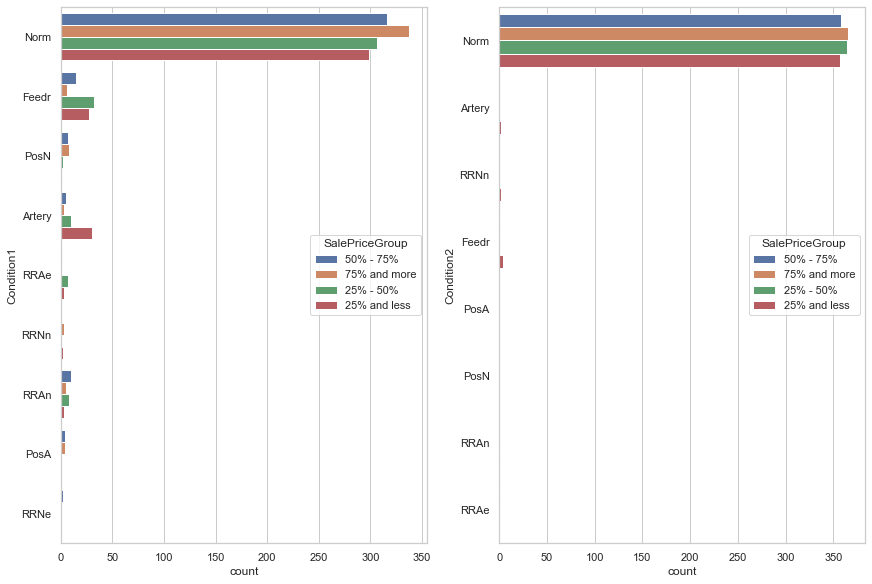

In [45]:
# ?
fig, ax = plt.subplots(1, 2, figsize=(12, 8), constrained_layout=True)

sns.countplot(data=fullDf, y="Condition1", hue="SalePriceGroup", ax=ax[0])
sns.countplot(data=fullDf, y="Condition2", hue="SalePriceGroup", ax=ax[1])

#### Roof Properties

<AxesSubplot:xlabel='count', ylabel='RoofMatl'>

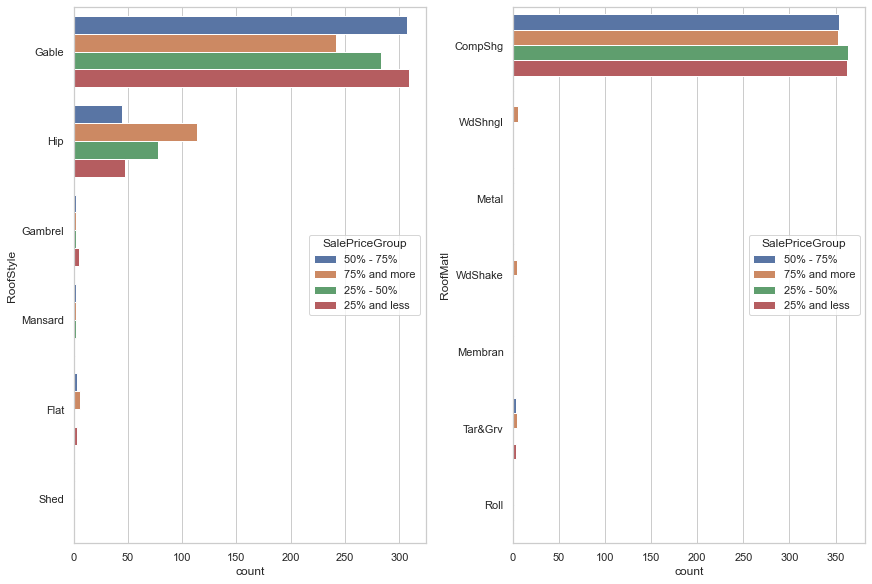

In [46]:
# ?
fig, ax = plt.subplots(1, 2, figsize=(12, 8), constrained_layout=True)

sns.countplot(data=fullDf, y="RoofStyle", hue="SalePriceGroup", ax=ax[0])
sns.countplot(data=fullDf, y="RoofMatl", hue="SalePriceGroup", ax=ax[1])

House Exterior Properties

<AxesSubplot:xlabel='count', ylabel='Exterior2nd'>

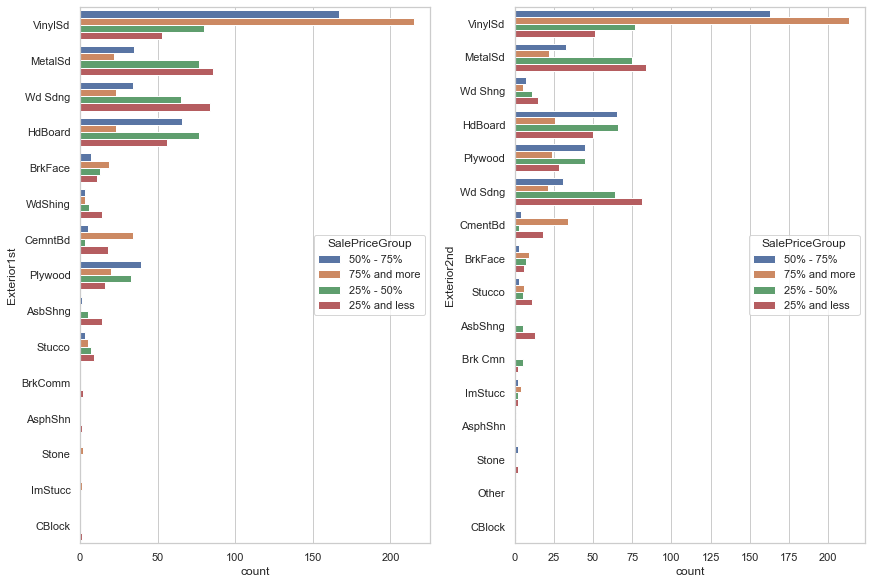

In [47]:
fig, ax = plt.subplots(1, 2, figsize=(12, 8), constrained_layout=True)

sns.countplot(data=fullDf, y="Exterior1st", hue="SalePriceGroup", ax=ax[0])
sns.countplot(data=fullDf, y="Exterior2nd", hue="SalePriceGroup", ax=ax[1])

#### Masonry Veneer

<AxesSubplot:xlabel='count', ylabel='MasVnrType'>

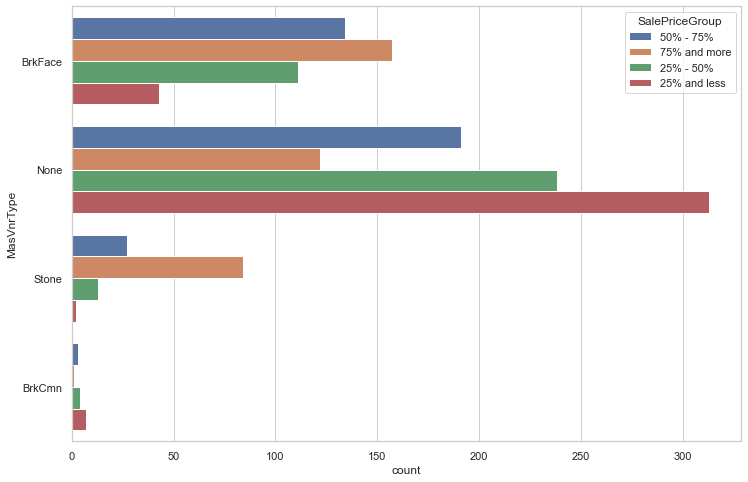

In [48]:
# ?
sns.countplot(data=fullDf, y="MasVnrType", hue="SalePriceGroup")

<AxesSubplot:xlabel='count', ylabel='ExterCond'>

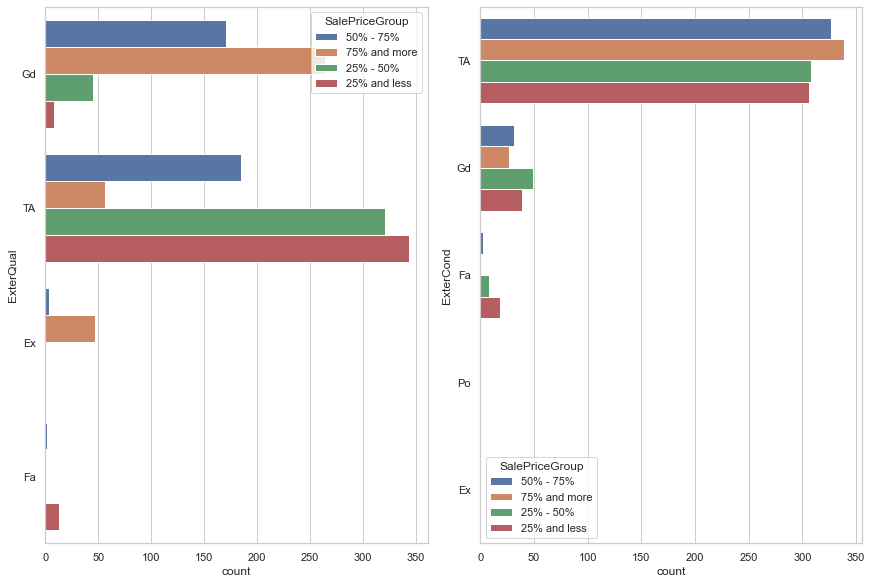

In [49]:
# Houses with SalePrice > 75% percentile have mostly good or excellent exterior quality. They also have average or good conditions.

## Houses with SalePrice < 50% percentile have mostly average quality and average condition.

fig, ax = plt.subplots(1, 2, constrained_layout=True)

sns.countplot(data=fullDf, y="ExterQual", hue="SalePriceGroup", ax=ax[0])
sns.countplot(data=fullDf, y="ExterCond", hue="SalePriceGroup", ax=ax[1])

Heating, Air Condition and Electrical Systems, Utilities

<AxesSubplot:xlabel='count', ylabel='HeatingQC'>

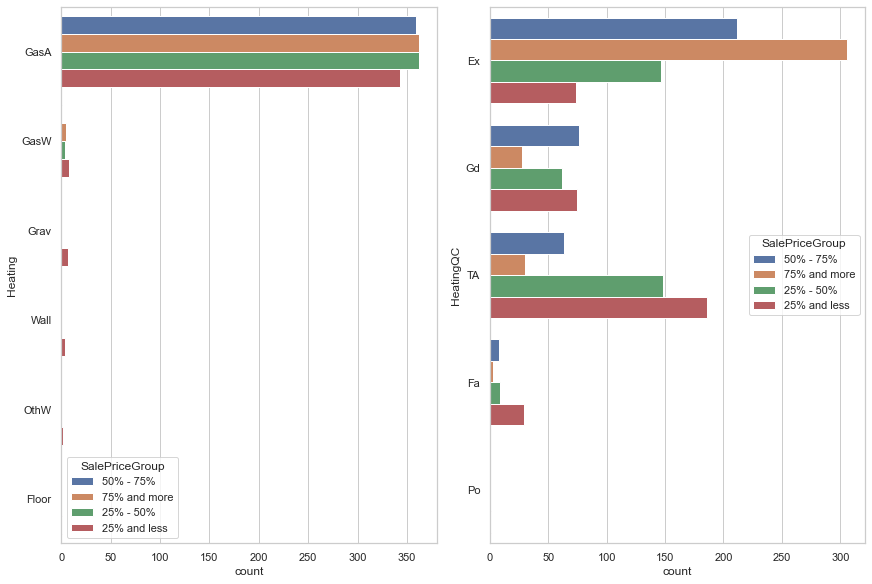

In [50]:
# Heating Types does differentiate samples with sale price below the mean
# Namely, wall, gravity, floor furneses and other heating were installed in houses that cheaper than the mean

# It seems like the mentioned heating systems are old fashion. Here is the YearBuilt ranges:
# Grav - 1910-1941
# Floor - 1949
# OthW - 1872-1917
# Wall - 1945-1952

# GasW - 1880-1970
# GasA - 1875-2010

## Most houses with SalePrice > 50% have from excellent to average quality of heating. Lower quality types includes mostly houses from < 50% percentile.

fig, ax = plt.subplots(1, 2, constrained_layout=True)

sns.countplot(data=fullDf, y="Heating", hue="SalePriceGroup", ax=ax[0])
sns.countplot(data=fullDf, y="HeatingQC", hue="SalePriceGroup", ax=ax[1])

<AxesSubplot:xlabel='count', ylabel='Electrical'>

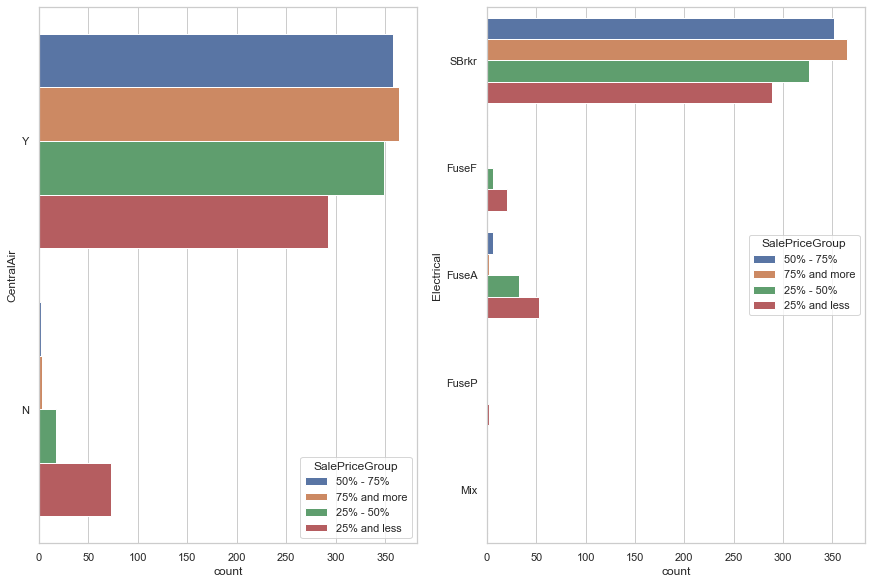

In [51]:
# Central AC seems to be an popular option in the dataset. Most of the houses from >50% percentile have it. 
# Central AC is not installed in cheap (<25% percentile) houses.
## More Info: https://www.thisoldhouse.com/heating-cooling/21018992/read-this-before-you-install-central-air-conditioning

# Most of the houses have "Standard Circuit Breakers & Romex" type of electricity. Houses from >50% dominates there. The rest of options are hold by <50% houses. They seem to be in the worst conditions.

fig, ax = plt.subplots(1, 2, figsize=(12, 8), constrained_layout=True)

sns.countplot(data=fullDf, y="CentralAir", hue="SalePriceGroup", ax=ax[0])
sns.countplot(data=fullDf, y="Electrical", hue="SalePriceGroup", ax=ax[1])

<AxesSubplot:xlabel='count', ylabel='Utilities'>

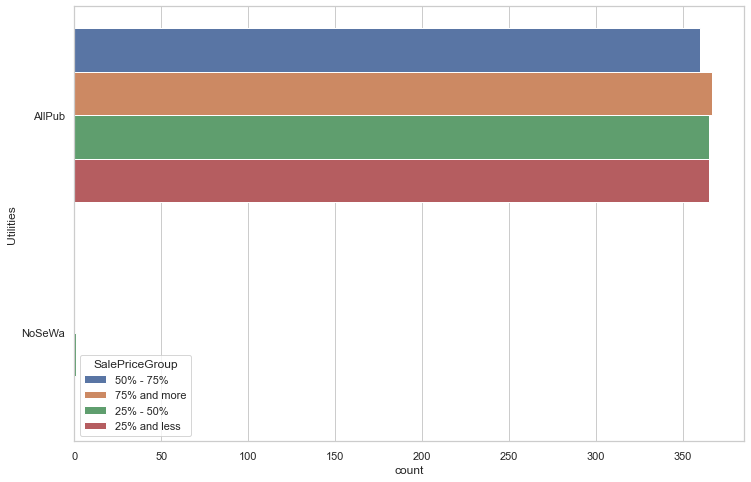

In [52]:
# Utilities feature has only one value in the dataset

sns.countplot(data=fullDf, y="Utilities", hue="SalePriceGroup")

In [53]:
fullDf[fullDf['Utilities'] != 'AllPub']

,1stFlrSF,2ndFlrSF,3SsnPorch,Alley,BedroomAbvGr,BldgType,BsmtCond,BsmtExposure,BsmtFinSF1,BsmtFinSF2,...,Street,TotRmsAbvGrd,TotalBsmtSF,Utilities,WoodDeckSF,YearBuilt,YearRemodAdd,YrSold,SalePriceGroup,LotAge
944,1344,0,0,NaN,3,1Fam,TA,No,111.0,354.0,...,Pave,7,819.0,NoSeWa,0,1958,1958,2009,25% - 50%,51
1915,810,0,0,NaN,1,1Fam,NaN,NaN,0.0,0.0,...,Grvl,4,0.0,NaN,119,1910,1950,2009,None,99
1945,1474,0,0,NaN,3,1Fam,TA,No,0.0,0.0,...,Pave,7,1632.0,NaN,0,1952,1952,2008,None,56


Kitchen Properties

<AxesSubplot:xlabel='count', ylabel='KitchenAbvGr'>

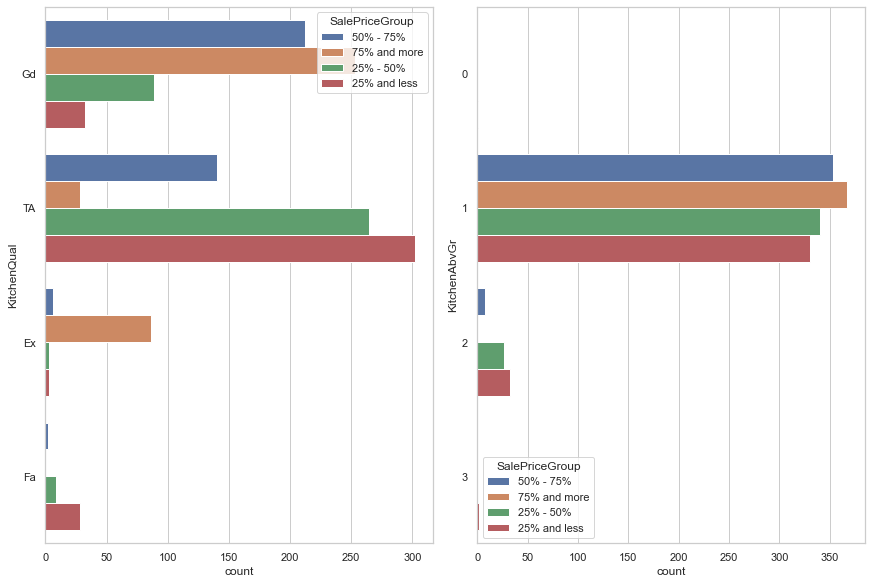

In [54]:
# ?
fig, ax = plt.subplots(1, 2, figsize=(12, 8), constrained_layout=True)

sns.countplot(data=fullDf, y="KitchenQual", hue="SalePriceGroup", ax=ax[0])
sns.countplot(data=fullDf, y="KitchenAbvGr", hue="SalePriceGroup", ax=ax[1])

Bathroom Properties

<AxesSubplot:xlabel='count', ylabel='HalfBath'>

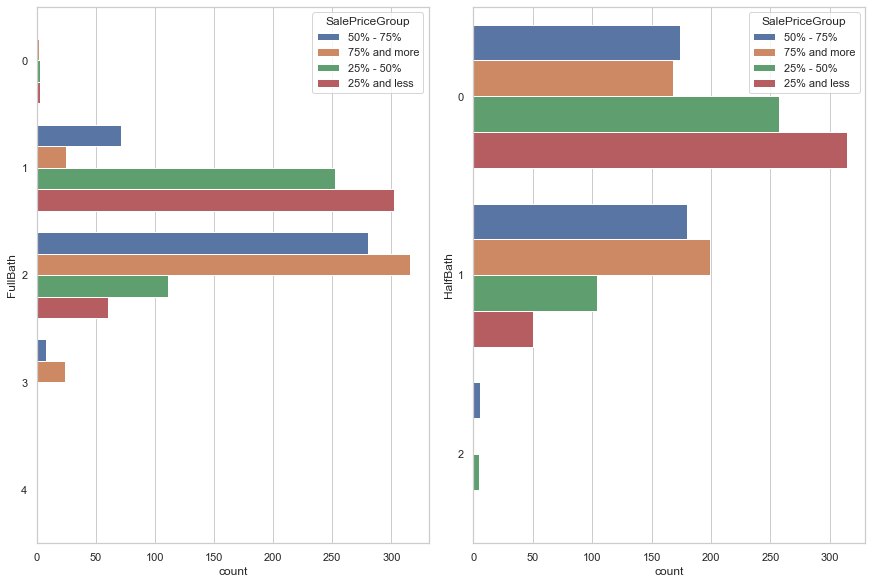

In [55]:
fig, ax = plt.subplots(1, 2, constrained_layout=True)

sns.countplot(data=fullDf, y="FullBath", hue="SalePriceGroup", ax=ax[0])
sns.countplot(data=fullDf, y="HalfBath", hue="SalePriceGroup", ax=ax[1])

#### Garage Properties

<AxesSubplot:xlabel='count', ylabel='GarageCars'>

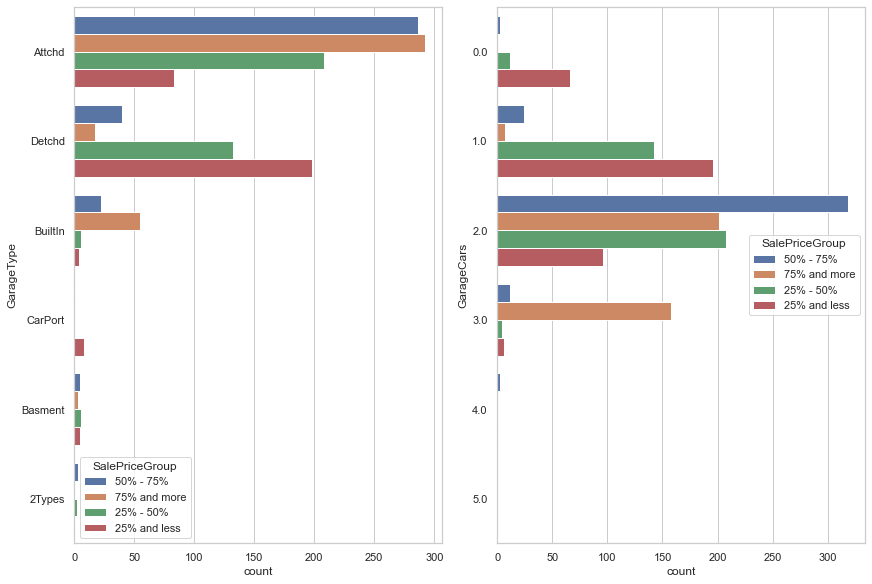

In [56]:
# Attached and Builtin garage types dominates among expensive houses (>50%). Their garages can contain 2 or 3 cars commonly. 
## Detached, CarPort types dominates among cheap houses (<50%). Their garage capacity is 1 car. No garages are also dominates among cheap houses.

fig, ax = plt.subplots(1, 2, constrained_layout=True)

sns.countplot(data=fullDf, y="GarageType", hue="SalePriceGroup", ax=ax[0])
sns.countplot(data=fullDf, y="GarageCars", hue="SalePriceGroup", ax=ax[1])

<AxesSubplot:xlabel='count', ylabel='GarageCond'>

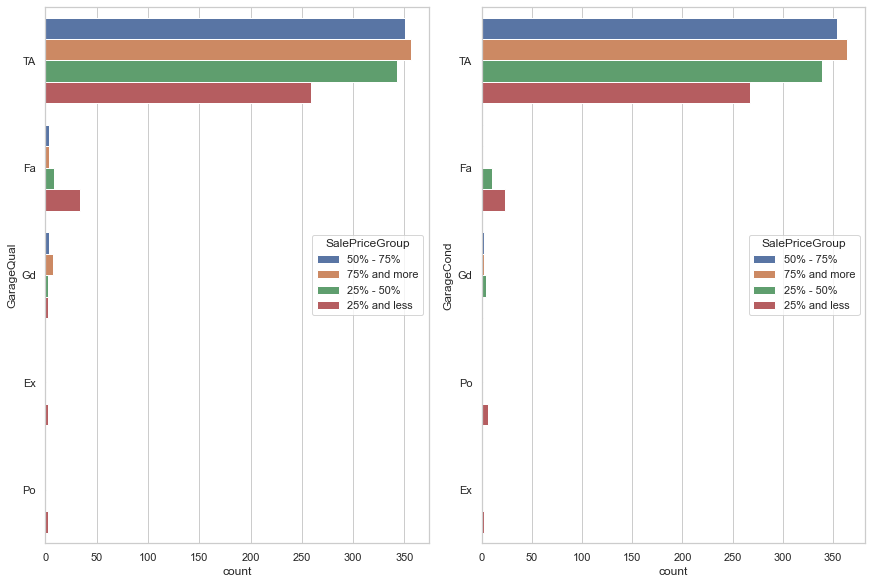

In [57]:
fig, ax = plt.subplots(1, 2, figsize=(12, 8), constrained_layout=True)

sns.countplot(data=fullDf, y="GarageQual", hue="SalePriceGroup", ax=ax[0])
sns.countplot(data=fullDf, y="GarageCond", hue="SalePriceGroup", ax=ax[1])

<AxesSubplot:xlabel='count', ylabel='GarageFinish'>

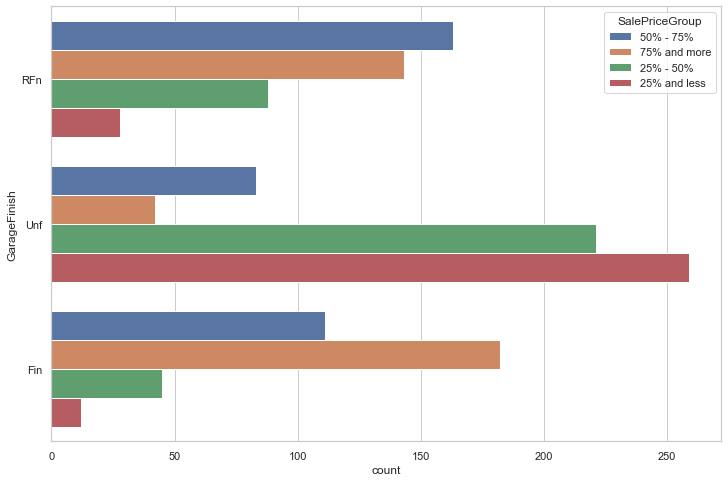

In [58]:
# Garage Finish correlates with house price. Most of the expensive houses (>50%) have garage finished or roughly finished. Unfinished garages were sold with cheap houses (<50%)

sns.countplot(data=fullDf, y="GarageFinish", hue="SalePriceGroup")

#### Fireplaces

<AxesSubplot:xlabel='count', ylabel='FireplaceQu'>

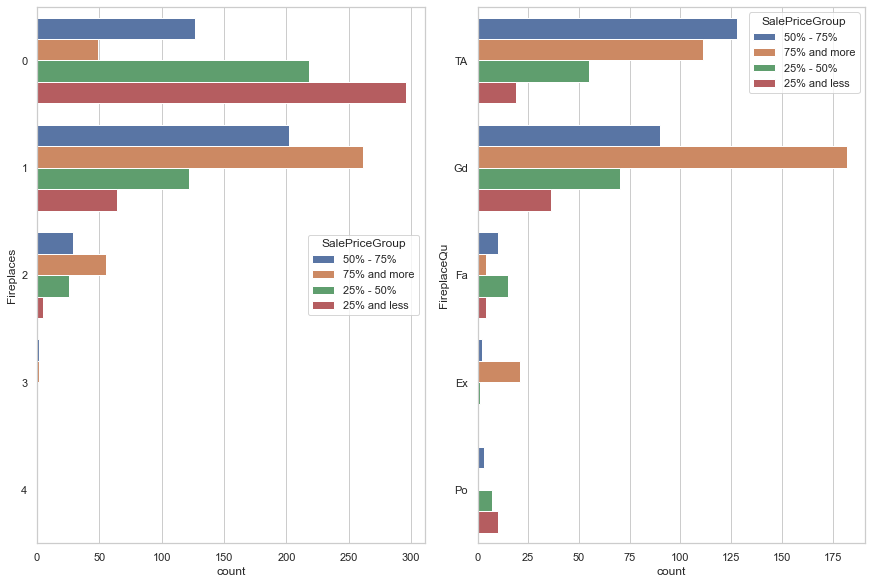

In [59]:
# Most of the cheap houses (<50%) don't have fireplaces or have one (most of the them are good or below avarage quality). Most of the expensive houses have 1 or 2 fireplaces with excellent, good or average quality.

fig, ax = plt.subplots(1, 2, constrained_layout=True)

sns.countplot(data=fullDf, y="Fireplaces", hue="SalePriceGroup", ax=ax[0])
sns.countplot(data=fullDf, y="FireplaceQu", hue="SalePriceGroup", ax=ax[1])

#### Pool

<AxesSubplot:xlabel='count', ylabel='PoolQC'>

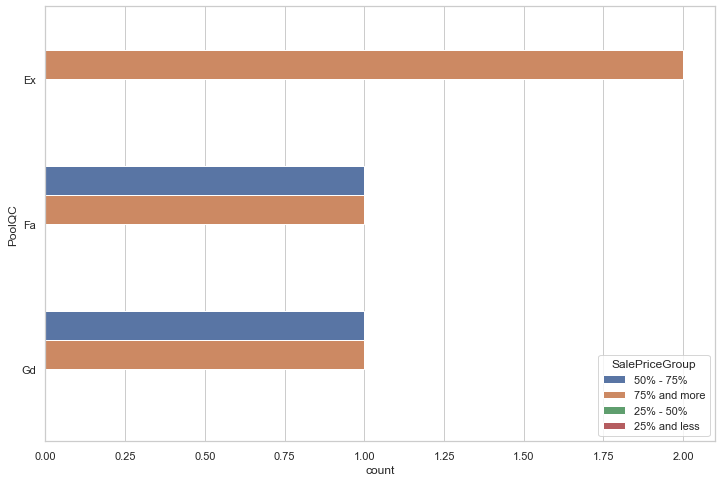

In [60]:
# Just a few lots have pools. None of houses that are cheaper than 25% have pools.
# There is an outlier with SalePrice < 50% and pool installed

sns.countplot(data=fullDf, y="PoolQC", hue="SalePriceGroup")

In [61]:
# Outlier

fullDf[(fullDf["SalePriceGroup"] == "25% - 50%") & (fullDf["PoolQC"] == 'Gd')][[
    'SalePrice',
    'PoolQC',
    'PoolArea',
    'TotRmsAbvGrd',
    'LotArea',
    'GrLivArea',
    'Neighborhood',
]]

,SalePrice,PoolQC,PoolArea,TotRmsAbvGrd,LotArea,GrLivArea,Neighborhood


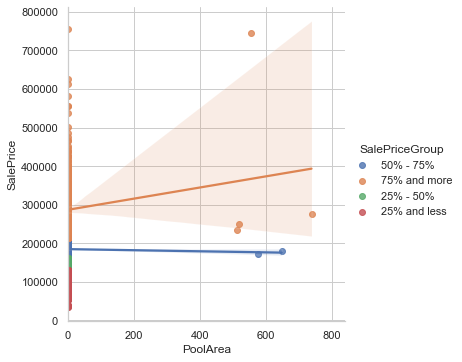

In [62]:
# ?
sns.lmplot(data=fullDf, x="PoolArea", y="SalePrice", hue="SalePriceGroup")

Fence

<AxesSubplot:xlabel='count', ylabel='Fence'>

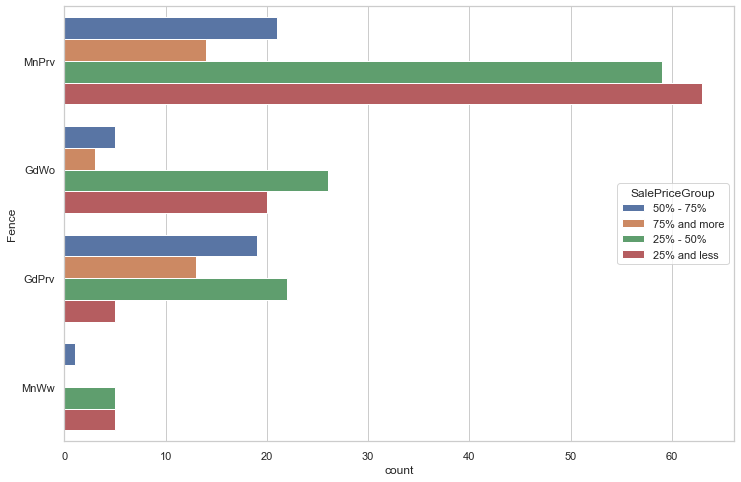

In [63]:
# Expensive houses (>50%) have good privacy/wood fences. Cheap houses (<50%) have minimal privacy/wood fences.

sns.countplot(data=fullDf, y="Fence", hue="SalePriceGroup")

Sale Information

<AxesSubplot:xlabel='count', ylabel='SaleCondition'>

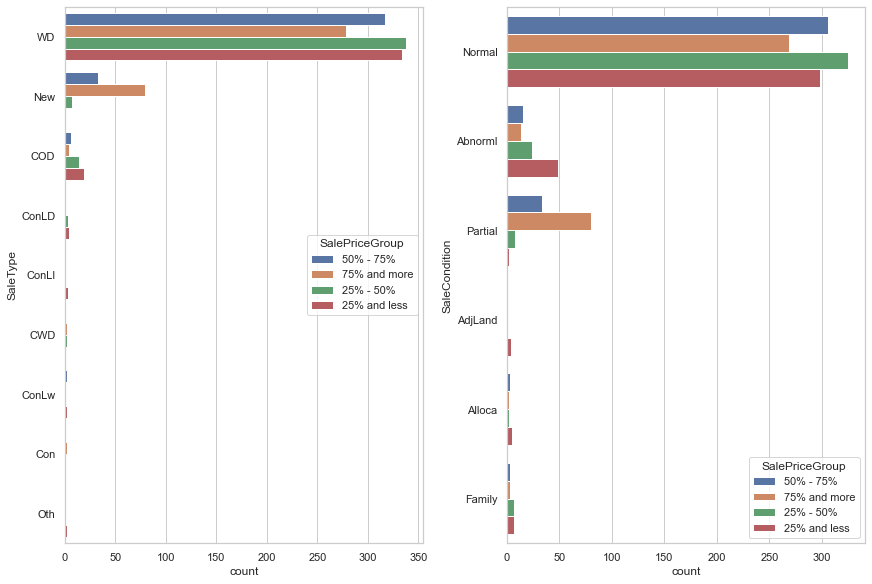

In [64]:


fig, ax = plt.subplots(1, 2, figsize=(12, 8), constrained_layout=True)

sns.countplot(data=fullDf, y="SaleType", hue="SalePriceGroup", ax=ax[0])
sns.countplot(data=fullDf, y="SaleCondition", hue="SalePriceGroup", ax=ax[1])

In [65]:
def imputeLivAreaSqFtPrice(saleInfo):
    totalLivingArea = saleInfo[0]
    salePrice = saleInfo[1]

    return salePrice / totalLivingArea

fullDf['LivAreaSqFtPrice'] = fullDf[['GrLivArea', 'SalePrice']].apply(imputeLivAreaSqFtPrice, axis=1)

<AxesSubplot:xlabel='MoSold,YrSold'>

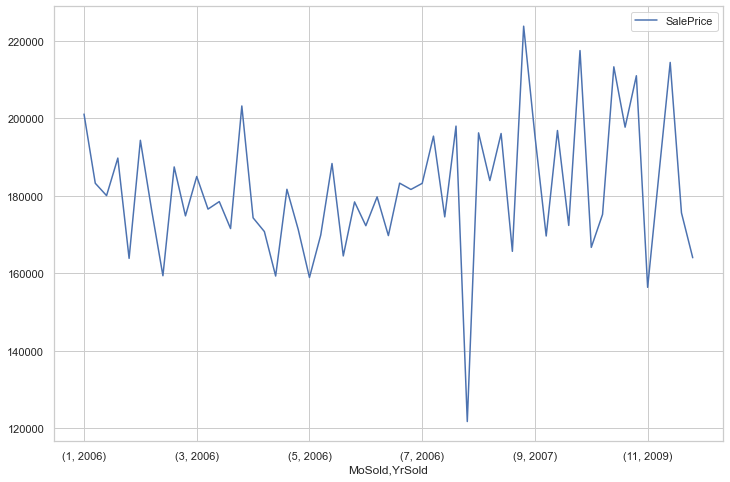

In [66]:
fullDf.groupby(['MoSold', 'YrSold'])[['SalePrice']].mean().plot()
